# Traditional Image Processing techniques

Non Deep Learning Image Processing Techniques (list may get updated):
- Color thresholding
- Filters
- Edge detectors (Sobel x and y, Canny)
- Fourier Transform
- HOUGH line detection (HOUGH space)
- Corner detectors
- Key points and descriptors


## Importing libraries

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np

%matplotlib inline

## Defining some functions

- read_image: read image convert from default openCV BGR to RGB

In [2]:
def read_image(filename):
    image = cv2.imread(filename)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [37]:
def ft_image(image):
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image = image / 255.0
    ft = np.fft.fft2(image)
    ft_shift = np.fft.fftshift(ft)
    freq_tx = 20 * np.log(np.abs(ft_shift))
    return freq_tx

# Color Thresholding

- Simple RGB space
- HSV space

### RGB Space

Original Image:
(514, 816, 3)


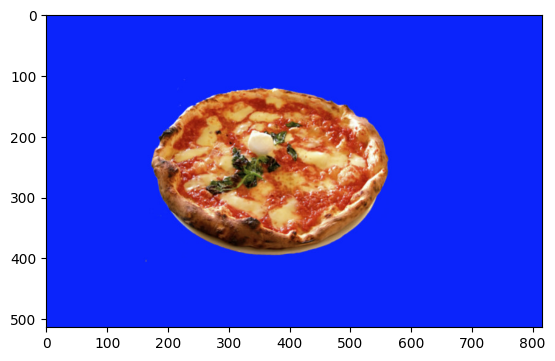

In [3]:
plt.figure(0);
filename = './cvImages/pizza_bluescreen.jpg'
image = read_image(filename)
print("Original Image:")
print(image.shape)
plt.imshow(image);

Color mask created by cv2.inRange:


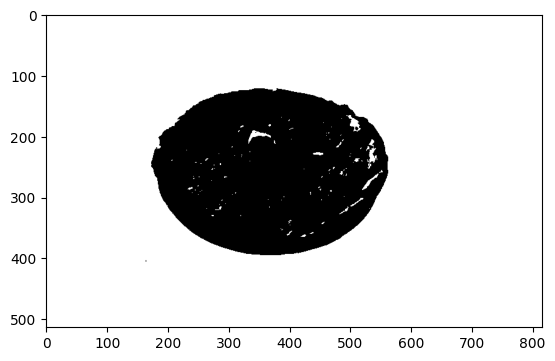

In [4]:
lower_bound = np.array([0, 0, 200])
upper_bound = np.array([255, 255, 255])

print("Color mask created by cv2.inRange:")

image_copy = np.copy(image)
mask = cv2.inRange(image_copy, lower_bound, upper_bound)
plt.imshow(mask, cmap = 'gray')

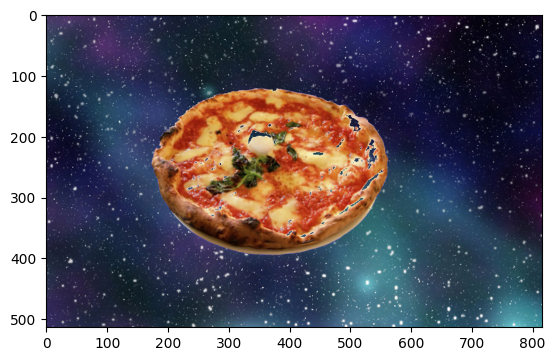

In [5]:
background_image = read_image('./cvImages/space_background.jpg')
background_image = background_image[0:image.shape[0], 0:image.shape[1]]

image_copy[mask != 0] = [0, 0, 0]

background_image[mask == 0] = [0, 0, 0]


image_in_background = image_copy + background_image
plt.imshow(image_in_background)

### HSV space

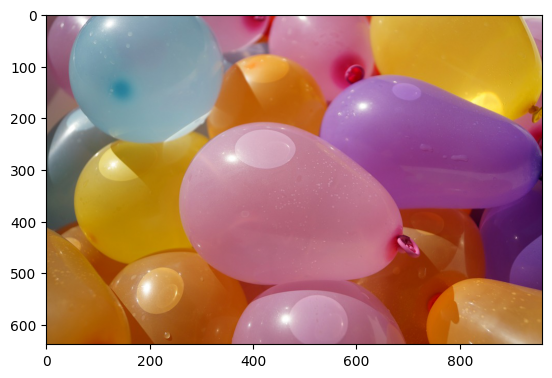

In [6]:
balloons = read_image('./cvImages/water_balloons.jpg')
plt.imshow(balloons)

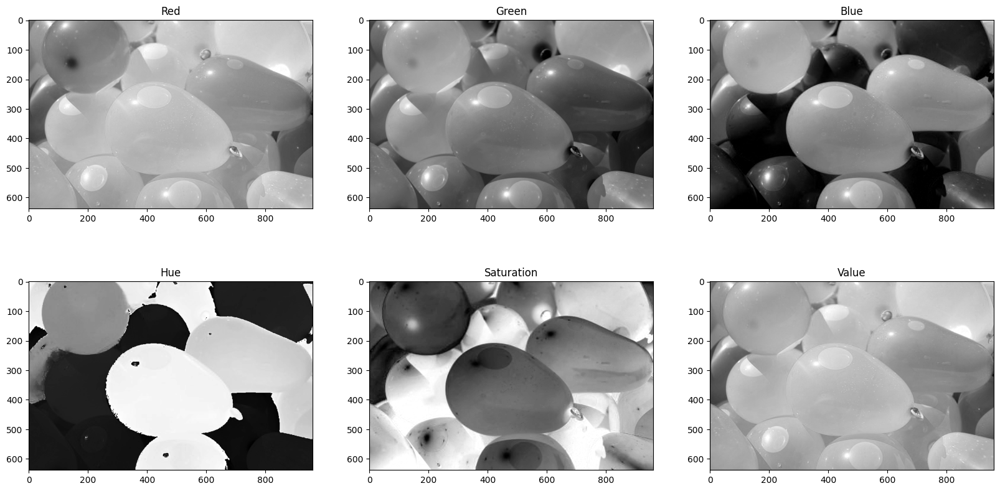

In [7]:
# RGB channels
r = balloons[:,:,0]
g = balloons[:,:,1]
b = balloons[:,:,2]

f, ax = plt.subplots(2, 3, figsize=(20,10))

ax[0,0].set_title('Red')
ax[0,0].imshow(r, cmap='gray')

ax[0,1].set_title('Green')
ax[0,1].imshow(g, cmap='gray')

ax[0,2].set_title('Blue')
ax[0,2].imshow(b, cmap='gray')

balloons_hsv = cv2.cvtColor(balloons, cv2.COLOR_RGB2HSV)
# HSV channels
h = balloons_hsv[:,:,0]
s = balloons_hsv[:,:,1]
v = balloons_hsv[:,:,2]

ax[1,0].set_title('Hue')
ax[1,0].imshow(h, cmap='gray')

ax[1,1].set_title('Saturation')
ax[1,1].imshow(s, cmap='gray')

ax[1,2].set_title('Value')
ax[1,2].imshow(v, cmap='gray')


Hue mask created by cv2.inRange:


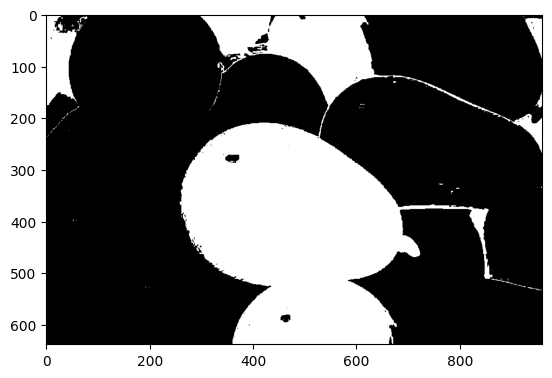

In [13]:
lower_bound = np.array([158, 0, 0])
upper_bound = np.array([185, 255, 255])

print("Hue mask created by cv2.inRange:")
hue_mask = cv2.inRange(balloons_hsv, lower_bound, upper_bound)
plt.imshow(hue_mask, cmap = 'gray')

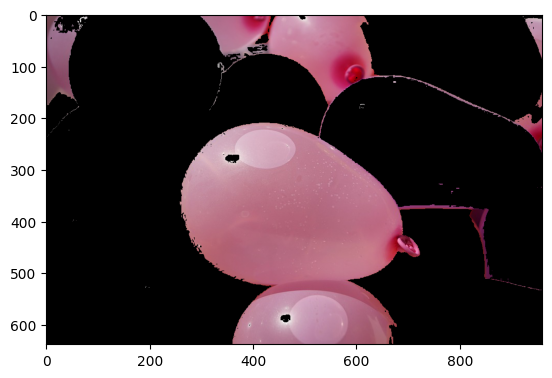

In [15]:
masked_balloons = np.copy(balloons)
masked_balloons[hue_mask == 0] = [0, 0, 0]

plt.imshow(masked_balloons)

# Fourier Transform


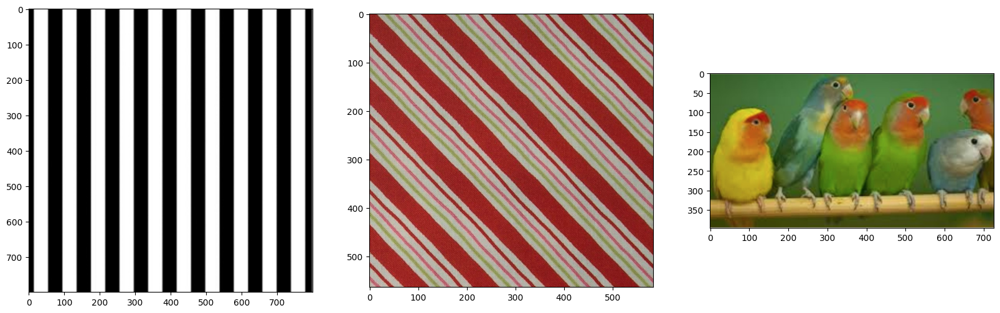

In [32]:
stripes = read_image('./cvImages/stripes.jpg')
diag_stripes = read_image('./cvImages/diag_stripes.PNG')
birds = read_image('./cvImages/birds.jpg')

f, ax = plt.subplots(1, 3, figsize = (20, 10))
ax[0].imshow(stripes)
ax[1].imshow(diag_stripes)
ax[2].imshow(birds)


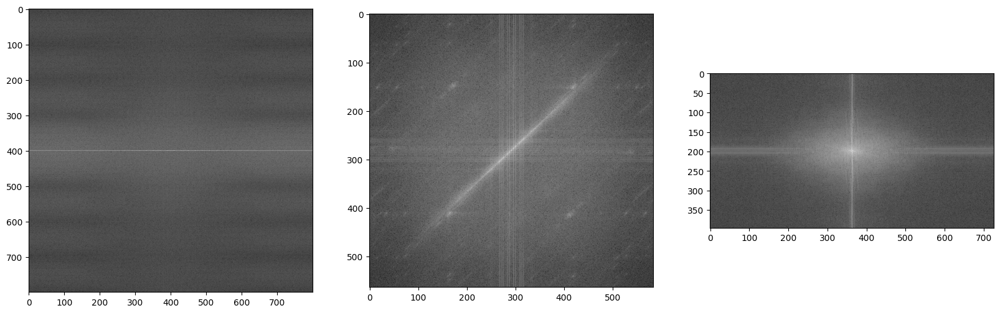

In [40]:
ft_stripes = ft_image(stripes)
ft_diag_stripes = ft_image(diag_stripes)
ft_birds = ft_image(birds)

f, ax = plt.subplots(1, 3, figsize = (20, 10))
ax[0].imshow(ft_stripes, cmap = 'gray')
ax[1].imshow(ft_diag_stripes, cmap = 'gray')
ax[2].imshow(ft_birds, cmap = 'gray')




# Filtering

- Noise reduction -> Edge detection: Edge detection (derivative amplifies the noise)

Text(0.5, 1.0, 'Blurred')

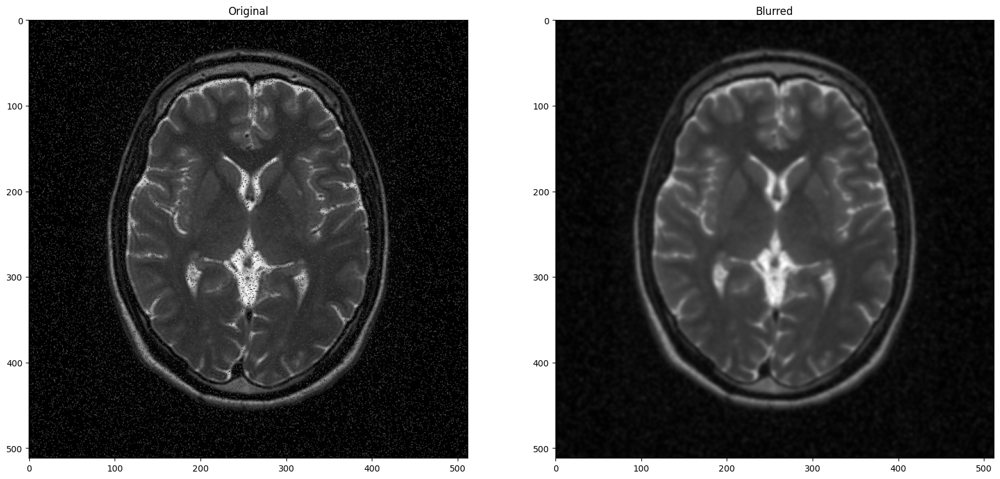

In [52]:
brain = read_image('./cvImages/noisy_brain_MR.jpg')

brain = cv2.cvtColor(brain, cv2.COLOR_RGB2GRAY)
brain_blurred = cv2.GaussianBlur(brain, (9, 9), 0)

f, ax = plt.subplots(1, 2, figsize = (20, 10))
ax[0].imshow(brain, cmap = 'gray')
ax[0].set_title('Original')

ax[1].imshow(brain_blurred, cmap = 'gray')
ax[1].set_title('Blurred')


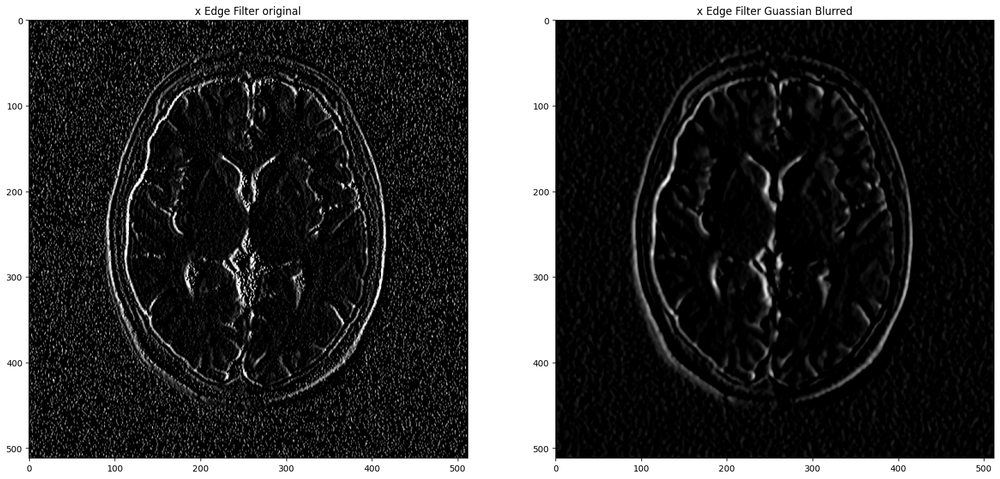

In [53]:
sobel_x = np.array( [ [-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]  ] )

sobel_y = np.array( [ [-1, -2, -1],
                    [0, 0, 0],
                    [1, 2, 1]  ] )


edge_x_original = cv2.filter2D(brain, -1, sobel_x)
edge_x_blurred  = cv2.filter2D(brain_blurred, -1, sobel_x)

f, ax = plt.subplots(1, 2, figsize = (20,10))

ax[0].set_title('x Edge Filter original')
ax[0].imshow(edge_x_original, cmap = 'gray')

ax[1].set_title('x Edge Filter Guassian Blurred')
ax[1].imshow(edge_x_blurred, cmap = 'gray')

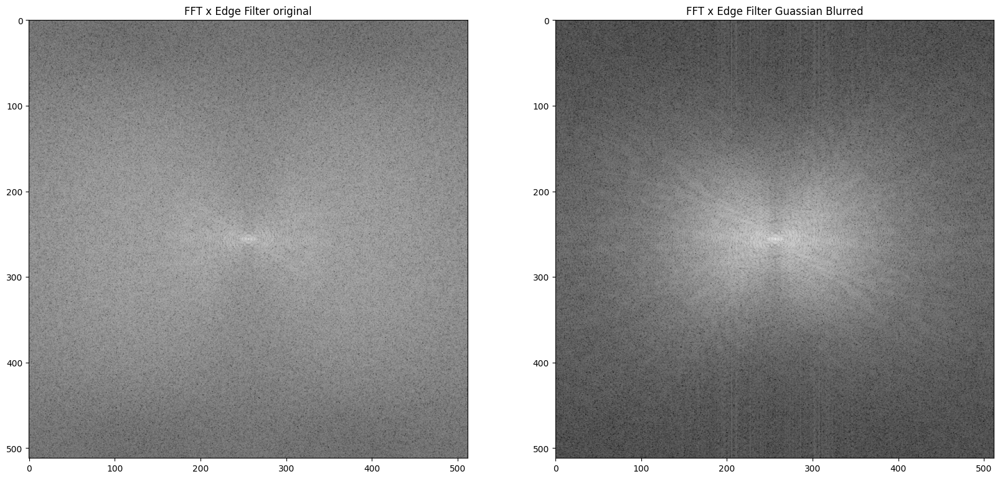

In [66]:
fft_edge_x_original = np.fft.fft2(edge_x_original)
fft_edge_x_original = np.fft.fftshift(fft_edge_x_original)
fft_edge_x_original = np.log(np.abs(fft_edge_x_original) + 1)

fft_edge_x_blurred = np.fft.fft2(edge_x_blurred)
fft_edge_x_blurred = np.fft.fftshift(fft_edge_x_blurred)
fft_edge_x_blurred = np.log(np.abs(fft_edge_x_blurred) + 1)

f, ax = plt.subplots(1, 2, figsize = (20,10))

ax[0].set_title('FFT x Edge Filter original')
ax[0].imshow(fft_edge_x_original, cmap = 'gray')

ax[1].set_title('FFT x Edge Filter Guassian Blurred')
ax[1].imshow(fft_edge_x_blurred, cmap = 'gray')

# Filters Fourier Transform



(512, 512)


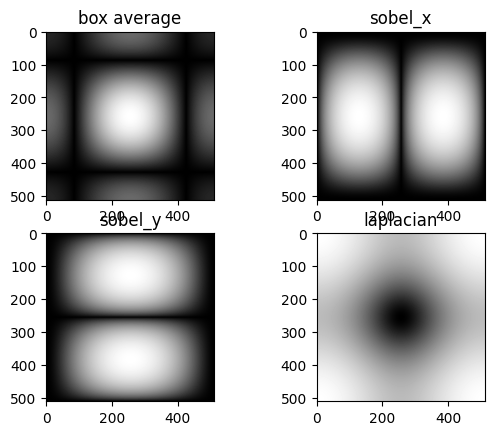

In [70]:
shape = edge_x_original.shape
print(shape)

Box_avg = (1/9)*np.array([[1, 1, 1],
                           [1, 1, 1],
                           [1, 1, 1]])

sobel_x = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])

sobel_y = np.array([[-1,-2,-1],
                   [0, 0, 0],
                   [1, 2, 1]])

laplacian = np.array([[0, 1, 0],
                    [1,-4, 1],
                    [0, 1, 0]])

filters = [gaussian, sobel_x, sobel_y, laplacian]
filters_name = ['box average','sobel_x', 'sobel_y', 'laplacian']

ft_filters = [np.fft.fft2(f, s = shape) for f in filters]
ft_filters = [np.fft.fftshift(f) for f in ft_filters]
freq_tx = [np.log(np.abs(f) + 1) for f in ft_filters]

count = 1
for mag, name in zip(freq_tx, filters_name):
    plt.subplot(2, 2, count)
    plt.imshow(mag, cmap = 'gray')
    plt.title(name)
    count += 1

In [65]:
freq_tx[1]

array([[1.00505254, 0.        , 1.00505254],
       [2.07042643, 0.        , 2.07042643],
       [1.00505254, 0.        , 1.00505254]])

## Canny edge detection

Challenges with edge detection:
- what level of intensity to use?
- How to be consistent in picking thin and thick edges?

Canny Edge is widely used. Canny steps:
- Grey scaling
- Gaussian Blur
- Sobelx and Sobely filters
- Apply non-max suppression to isolate strongest edges and think them one-pixel wide line
- Hysteresis thresholding (define high and low thresholds, if something between thresholds only keep if connected to a strong edge)

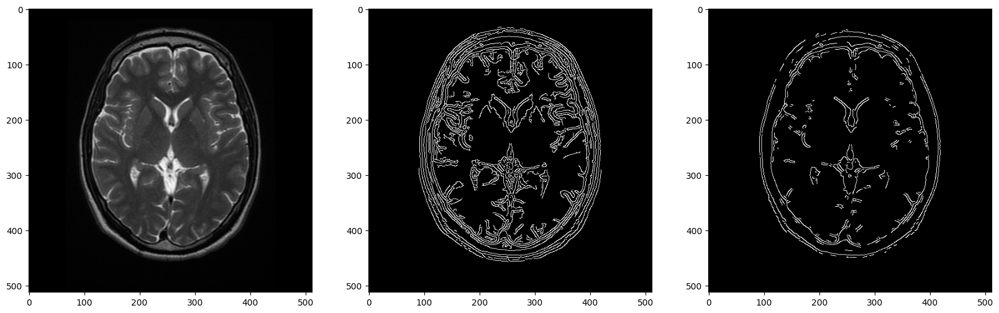

In [76]:
brain = read_image('./cvImages/brain_MR.jpg')
brain = cv2.cvtColor(brain, cv2.COLOR_RGB2GRAY)
brain_wide_edge  = cv2.Canny(brain, 30, 100)
brain_tight_edge = cv2.Canny(brain, 200, 240)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (20,10))
ax1.imshow(brain, cmap = 'gray')
ax2.imshow(brain_wide_edge, cmap = 'gray')
ax3.imshow(brain_tight_edge, cmap = 'gray')


## HOUGH Line Detection

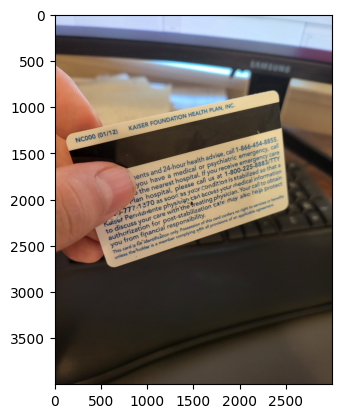

In [133]:
card = cv2.imread('./cvImages/card.jpg')
card = cv2.cvtColor(card, cv2.COLOR_BGR2RGB)
card_gray = cv2.cvtColor(card, cv2.COLOR_RGB2GRAY)
plt.imshow(card, cmap = 'gray')


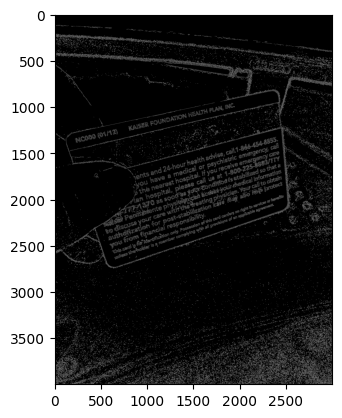

In [152]:
low_threshold = 30
high_threshold = 60
edges = cv2.Canny(card_gray, low_threshold, high_threshold)
plt.imshow(edges, cmap='gray')

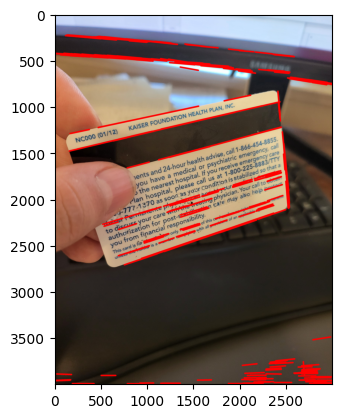

In [160]:
rho = 1
theta = np.pi/180
threshold = 400 # how many intersections
min_line_length = 150
max_line_gap = 13

line_image = np.copy(card) #creating an image copy to draw lines on

# Run Hough on the edge-detected image
lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]),
                        min_line_length, max_line_gap)


# Iterate over the output "lines" and draw lines on the image copy
for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),15)
        
plt.imshow(line_image)

# Key Points

- Corner detector: like Harris: Calculate Gx and Gy and calculate Gtotal and angle of gradient. Detect largest shift in gradient when moving a window

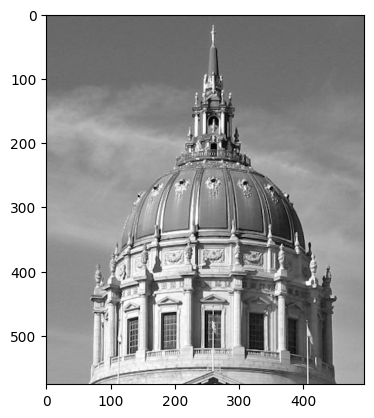

In [180]:
city_hall = cv2.imread('./cvImages/city_hall_zoom.PNG')
city_hall = cv2.cvtColor(city_hall, cv2.COLOR_BGR2RGB)
city_hall_gray = cv2.cvtColor(city_hall, cv2.COLOR_RGB2GRAY)
plt.imshow(city_hall_gray, cmap = 'gray')

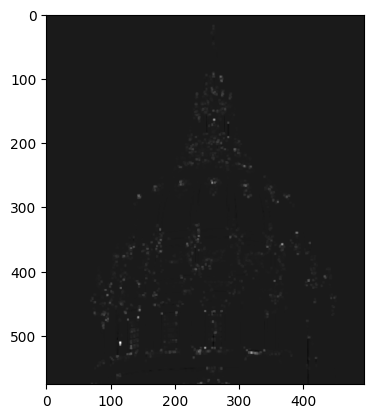

In [181]:
city_hall_gray = np.float32(city_hall_gray)

#dst has the same shame as image and tracks the gradients
dst = cv2.cornerHarris(city_hall_gray,
                      2, #size of window
                      3, #kernel size of derivatives
                      0.04
                      )

dst = cv2.dilate(dst,None)

plt.imshow(dst, cmap='gray')

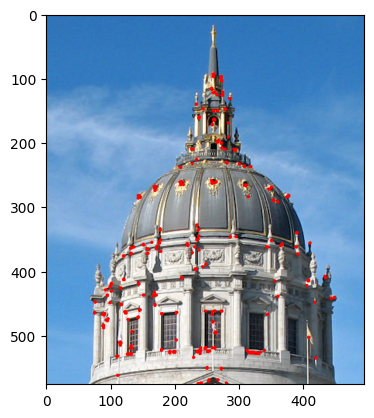

In [183]:
thresh = 0.1*dst.max()

corner_image = np.copy(city_hall)

for j in range(0, dst.shape[0]):
    for i in range(0, dst.shape[1]):
        if(dst[j,i] > thresh):
            # image, center pt, radius, color, thickness
            cv2.circle(corner_image, (i, j), 1, (255,0,0), 1)

plt.imshow(corner_image)

## Dilation and Erosion

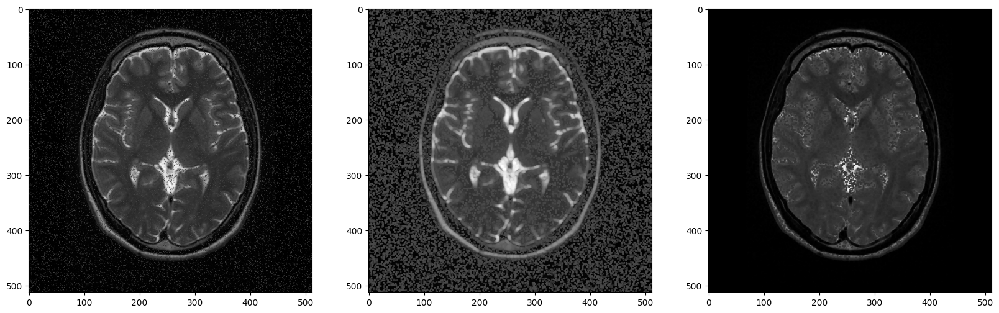

In [196]:
brain = read_image('./cvImages/noisy_brain_MR.jpg')

brain = cv2.cvtColor(brain, cv2.COLOR_RGB2GRAY)

kernel = np.ones((3,3),np.uint8)

brain_dilation = cv2.dilate(brain, kernel, iterations = 1)
brain_erosion  = cv2.erode(brain, kernel, iterations = 1) 

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (20, 10))
ax1.imshow(brain, cmap = 'gray')
ax2.imshow(brain_dilation, cmap = 'gray')
ax3.imshow(brain_erosion, cmap = 'gray')

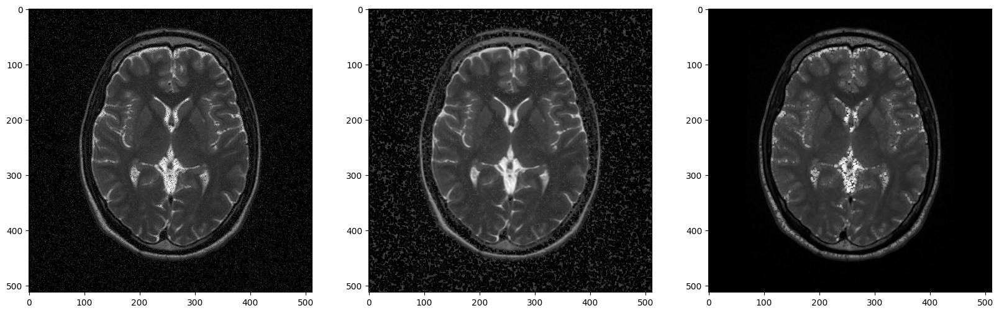

In [198]:
brain_dilated_eroded = cv2.erode(brain_dilation, kernel, iterations = 1)
brain_eroded_dilated = cv2.dilate(brain_erosion, kernel, iterations = 1)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (20, 10))
ax1.imshow(brain, cmap = 'gray')
ax2.imshow(brain_dilated_eroded, cmap = 'gray')
ax3.imshow(brain_eroded_dilated, cmap = 'gray')
